## User Engegement Analysis

***Expectation***
 - session frequency
 - duration session
 - session total traffic(DL+UL)

#### Import packages


In [146]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os

sys.path.append(os.path.abspath(os.path.join("../script")))
from data_clean_handler import CleanData
from get_dataframe_information import DataFrameInformation
from ploting_utils import PlotingUtils


In [147]:
import logging
logging.basicConfig(filename='../logfile.log', filemode='a',
                    encoding='utf-8', level=logging.DEBUG)

#### Read the cleaned dataframe 

In [148]:
try:
    df = pd.read_csv('../data/clean_data.csv')
except BaseException:
    logging.error('file not found or wrong format')


/var/folders/6b/0t1qb1d92f72c46kvp35pwfc0000gn/T/ipykernel_6371/1400606392.py:2: DtypeWarning:

Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.



In [149]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148935 entries, 0 to 148934
Data columns (total 45 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Bearer Id                       148935 non-null  object 
 1   Start                           148935 non-null  object 
 2   Start ms                        148935 non-null  float64
 3   End                             148935 non-null  object 
 4   End ms                          148935 non-null  float64
 5   Dur. (ms)                       148935 non-null  float64
 6   IMSI                            148935 non-null  float64
 7   MSISDN/Number                   148935 non-null  float64
 8   IMEI                            148935 non-null  float64
 9   Last Location Name              148935 non-null  object 
 10  Avg RTT DL (ms)                 148935 non-null  float64
 11  Avg RTT UL (ms)                 148935 non-null  float64
 12  Avg Bearer TP DL

In [150]:
df.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI',
       'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1',
       'Handset Manufacturer', 'Handset Type', 'Nb of sec with Vol DL < 6250B',
       'Nb of sec with Vol UL < 1250B', 'Social Media DL (Bytes)',
       'Social Media UL (Bytes)', 'Google DL (Bytes)', 'Google UL (Bytes)',
       'Email DL (Bytes)', 'Email UL (Bytes)', 'Youtube DL (Bytes)',
       'Youtube UL (Bytes)', 'Netflix DL (Bytes)', 'Netflix UL (Bytes)',
       'Gaming DL (Bytes)', 'Gaming UL (Bytes)', 'Other DL (Bytes)',


In [151]:
cleaner = CleanData(df)

In [152]:
to_string = ['IMEI', 'IMSI', 'MSISDN/Number']

for col in to_string:
    df[col] = df[col].astype('category')


In [153]:
cleaner = CleanData(df)
#replace the missing wiht mode

selected_df = cleaner.fill_mode(df.copy(), df[1:])

# drop the rows with null after mode fillinåg
selected_df = selected_df.dropna(axis=0)
selected_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148935 entries, 0 to 148934
Data columns (total 45 columns):
 #   Column                          Non-Null Count   Dtype   
---  ------                          --------------   -----   
 0   Bearer Id                       148935 non-null  object  
 1   Start                           148935 non-null  object  
 2   Start ms                        148935 non-null  float64 
 3   End                             148935 non-null  object  
 4   End ms                          148935 non-null  float64 
 5   Dur. (ms)                       148935 non-null  float64 
 6   IMSI                            148935 non-null  category
 7   MSISDN/Number                   148935 non-null  category
 8   IMEI                            148935 non-null  category
 9   Last Location Name              148935 non-null  object  
 10  Avg RTT DL (ms)                 148935 non-null  float64 
 11  Avg RTT UL (ms)                 148935 non-null  float64 
 12  Av

In [154]:
from unicodedata import category
df.describe(exclude=[object,'category'])

df = cleaner.handle_outliers(df,0.25,0.25)
df

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,13114483460844900352,2019-04-04 12:01:18,749.0,2019-04-25 14:35:31,662.0,132700.0,2.082014e+14,3.366496e+10,3.552121e+13,9164566995485190,...,15854611.0,5516630.0,8198936.0,9656251.0,278082303.0,12431866.0,210210522.0,8814393.0,36749741.0,308879636.0
1,13114483482878900224,2019-04-09 13:04:04,250.0,2019-04-25 08:15:48,606.0,132700.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,17445747.0,16514443.0,17470857.0,16504387.0,608750074.0,4130119.0,526904238.0,12382051.0,49032572.0,653384965.0
2,13114483484080500736,2019-04-09 17:42:11,250.0,2019-04-25 11:58:13,652.0,132700.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,17445747.0,14699576.0,17470857.0,6163408.0,229584621.0,4130119.0,410692588.0,4215763.0,33217523.0,279807335.0
3,13114483485442799616,2019-04-10 00:31:25,486.0,2019-04-25 07:36:35,251.0,132700.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,17445747.0,15146643.0,13994646.0,5474441.0,633171122.0,10849722.0,631660688.0,12382051.0,43324218.0,665661693.0
4,13114483499480700928,2019-04-12 20:10:23,565.0,2019-04-25 10:40:32,750.0,132700.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,16514443.0,17124581.0,5474441.0,527707248.0,4130119.0,550709500.0,12382051.0,38542814.0,569138589.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148930,13042425979329300480,2019-04-29 07:28:41,615.0,2019-04-30 00:01:49,407.0,59587.0,2.082014e+14,3.366865e+10,3.533251e+13,T85721A,...,6550499.0,16514443.0,17470857.0,7149728.0,633171122.0,12431866.0,321383162.0,12382051.0,49032572.0,665661693.0
148931,7277825670196679680,2019-04-29 07:28:42,451.0,2019-04-30 06:02:33,251.0,81230.0,2.082022e+14,3.365069e+10,3.548311e+13,D20434A,...,16191667.0,11763428.0,17470857.0,16504387.0,526609673.0,9197207.0,210210522.0,12382051.0,49032572.0,574175259.0
148932,7349883264234609664,2019-04-29 07:28:42,483.0,2019-04-30 10:41:33,251.0,97970.0,2.082019e+14,3.366345e+10,3.566051e+13,D10223C,...,13877234.0,8288284.0,17470857.0,16504387.0,626893062.0,4735033.0,631660688.0,4145042.0,39135081.0,665661693.0
148933,13114483573367300096,2019-04-29 07:28:43,283.0,2019-04-30 10:46:12,750.0,98249.0,2.082017e+14,3.362189e+10,3.572121e+13,T51102A,...,17445747.0,5516630.0,9963942.0,5474441.0,553539484.0,12431866.0,210210522.0,11314729.0,34912224.0,592786405.0


### Task 2.1

### A. Aggregate session frequeuncy, duration, traffic

1. Duration of the session

In [155]:
total_duration = df.groupby('MSISDN/Number').agg(
    {'Dur. (ms)': 'sum'}).reset_index().rename(columns={'Dur. (ms)': 'total_duration'})

total_duration

,MSISDN/Number,total_duration
0,3.360100e+10,116720.0
1,3.360100e+10,132700.0
2,3.360100e+10,132700.0
3,3.360101e+10,57883.0
4,3.360101e+10,115766.0
...,...,...
106851,3.379000e+10,57883.0
106852,3.379000e+10,132700.0
106853,3.197021e+12,132700.0
106854,3.370000e+14,132700.0


<AxesSubplot:>

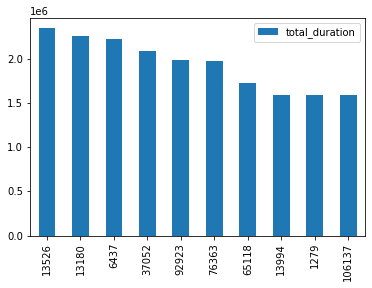

In [156]:
sorted_df = total_duration.sort_values('total_duration',ascending=False)[:10]
sorted_df.plot.bar()


2. Session total traffic 

In [157]:
datainfo = DataFrameInformation(df)
dl_columns = datainfo.get_column_with_string(df, 'DL \(Bytes\)')
total_download = df.groupby(
    'MSISDN/Number').agg({c: 'sum' for c in dl_columns}).sum(axis=1)
total_download = pd.DataFrame(total_download).reset_index().rename(
    columns={0: 'total_download'})
total_download


,MSISDN/Number,total_download
0,3.360100e+10,1.707531e+09
1,3.360100e+10,7.542063e+08
2,3.360100e+10,1.611647e+09
3,3.360101e+10,1.020905e+09
4,3.360101e+10,3.252992e+09
...,...,...
106851,3.379000e+10,1.621899e+09
106852,3.379000e+10,1.101462e+09
106853,3.197021e+12,9.517748e+08
106854,3.370000e+14,1.289583e+09


<AxesSubplot:>

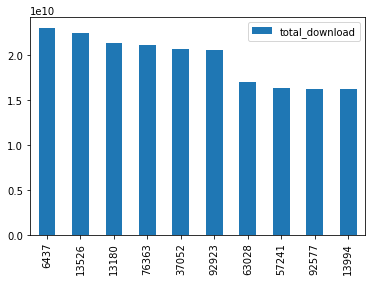

In [158]:
sorted_df = total_download.sort_values('total_download', ascending=False)[:10]
sorted_df.plot.bar()


In [159]:
ul_columns = datainfo.get_column_with_string(df, 'UL \(Bytes\)')
total_upload = df.groupby('MSISDN/Number').agg({c:'sum' for c in ul_columns}).sum(axis=1)
total_upload = pd.DataFrame(total_upload).reset_index().rename(columns={0:'total_upload'})
total_upload

,MSISDN/Number,total_upload
0,3.360100e+10,74457318.0
1,3.360100e+10,71905986.0
2,3.360100e+10,79434108.0
3,3.360101e+10,61721023.0
4,3.360101e+10,178377645.0
...,...,...
106851,3.379000e+10,65080804.0
106852,3.379000e+10,74694621.0
106853,3.197021e+12,78231846.0
106854,3.370000e+14,97738665.0


<AxesSubplot:>

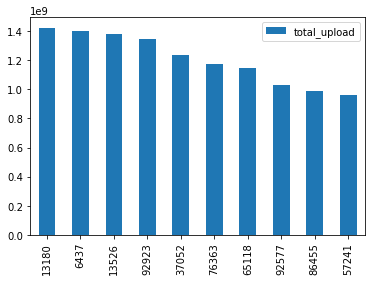

In [160]:
sorted_df = total_upload.sort_values('total_upload', ascending=False)[:10]
sorted_df.plot.bar()

In [161]:
total_traffic = total_download.merge(total_upload, on='MSISDN/Number')
#convert bytes ot Mega Bytes
# cleaner = CleanData(total_traffic)

# total_traffic = cleaner.convert_bytes_to_megabytes(
#     total_traffic, ['total download', 'total upload'])

total_data = pd.DataFrame(total_traffic['MSISDN/Number'])
total_data['total_data'] = total_traffic['total_download'] + total_traffic['total_upload']
total_data


,MSISDN/Number,total_data
0,3.360100e+10,1.781989e+09
1,3.360100e+10,8.261122e+08
2,3.360100e+10,1.691081e+09
3,3.360101e+10,1.082626e+09
4,3.360101e+10,3.431369e+09
...,...,...
106851,3.379000e+10,1.686980e+09
106852,3.379000e+10,1.176157e+09
106853,3.197021e+12,1.030007e+09
106854,3.370000e+14,1.387322e+09


<AxesSubplot:>

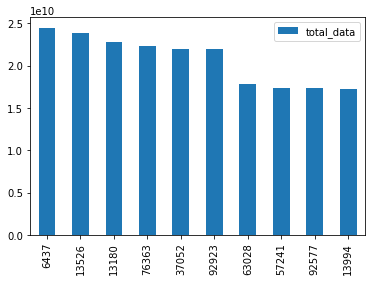

In [162]:
sorted_df = total_data.sort_values('total_data', ascending=False)[:10]
sorted_df.plot.bar()


3. Sessions Frequency

In [163]:
total_freq = df.groupby('MSISDN/Number').agg(
    {'Bearer Id': 'count'}).reset_index().rename(columns={'Bearer Id': 'total_freq'})

total_freq


,MSISDN/Number,total_freq
0,3.360100e+10,1
1,3.360100e+10,1
2,3.360100e+10,1
3,3.360101e+10,1
4,3.360101e+10,2
...,...,...
106851,3.379000e+10,1
106852,3.379000e+10,1
106853,3.197021e+12,1
106854,3.370000e+14,1


<AxesSubplot:>

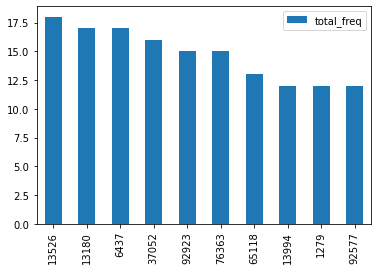

In [164]:
sorted_df = total_freq.sort_values('total_freq', ascending=False)[:10]
sorted_df.plot.bar()


***Put the all the aggregation together***

In [196]:
new_df = total_data.merge(total_duration,how='inner' , on='MSISDN/Number')
new_df = new_df.merge(total_freq, how='inner' , on='MSISDN/Number')
new_new_df = new_df.select_dtypes(exclude='category')
new_new_df

,total_data,total_duration,total_freq
0,1.781989e+09,116720.0,1
1,8.261122e+08,132700.0,1
2,1.691081e+09,132700.0,1
3,1.082626e+09,57883.0,1
4,3.431369e+09,115766.0,2
...,...,...,...
106851,1.686980e+09,57883.0,1
106852,1.176157e+09,132700.0,1
106853,1.030007e+09,132700.0,1
106854,1.387322e+09,132700.0,1


### B. Normalization and k-means clustering with k=3

1. mean normalization

In [197]:
normalized_df = (new_new_df - new_new_df.mean())/new_new_df.std()
normalized_df

,total_data,total_duration,total_freq
0,-0.152782,-0.147855,-0.488562
1,-0.934494,0.032597,-0.488562
2,-0.227126,0.032597,-0.488562
3,-0.724718,-0.812261,-0.488562
4,1.196076,-0.158628,0.752099
...,...,...,...
106851,-0.230480,-0.812261,-0.488562
106852,-0.648229,0.032597,-0.488562
106853,-0.767750,0.032597,-0.488562
106854,-0.475539,0.032597,-0.488562


2. k-means clustering

In [167]:
from sklearn.cluster import KMeans
Kmean = KMeans(n_clusters=3)
Kmean.fit(normalized_df)

centroids = Kmean.cluster_centers_
centroids

array([[ 0.8590433 ,  0.68480807,  0.93367013],
       [-0.45270143, -0.39741988, -0.48513978],
       [ 3.44280687,  3.44858762,  3.60914644]])

In [198]:
from types import new_class

new_df['engagement_score'] = normalized_df.apply(lambda x: np.sqrt(np.sum(np.power(x-centroids[:, 0], 2))), axis=1)
new_df.to_csv('../data/user_engagement_score.csv',index=False)
new_df

,MSISDN/Number,total_data,total_duration,total_freq,engagement_score
0,3.360100e+10,1.781989e+09,116720.0,1,3.746078
1,3.360100e+10,8.261122e+08,132700.0,1,3.604782
2,3.360100e+10,1.691081e+09,132700.0,1,3.573376
3,3.360101e+10,1.082626e+09,57883.0,1,4.375125
4,3.360101e+10,3.431369e+09,115766.0,2,3.863847
...,...,...,...,...,...
106851,3.379000e+10,1.686980e+09,57883.0,1,4.368779
106852,3.379000e+10,1.176157e+09,132700.0,1,3.575286
106853,3.197021e+12,1.030007e+09,132700.0,1,3.584852
106854,3.370000e+14,1.387322e+09,132700.0,1,3.568497


In [169]:
centroids_df = pd.DataFrame(centroids)
centroids_df

,0,1,2
0,0.859043,0.684808,0.933670
1,-0.452701,-0.397420,-0.485140
2,3.442807,3.448588,3.609146


In [170]:
centroids_df[0]


0    0.859043
1   -0.452701
2    3.442807
Name: 0, dtype: float64

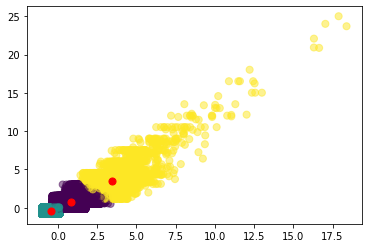

In [171]:
plt.scatter(normalized_df['total_data'], normalized_df['total_duration'],
            c=Kmean.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids_df[0], centroids_df[1], c='red', s=50)
plt.show()


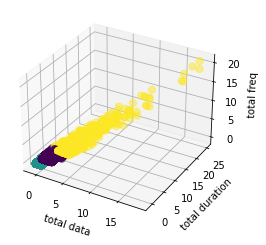

In [172]:
# Create the figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Generate the values
x_vals = normalized_df['total_data']
y_vals = normalized_df['total_duration']
z_vals = normalized_df['total_freq']

# # Plot the values

ax.scatter(centroids_df[0], centroids_df[1], centroids_df[2], c='red', s=100)
ax.scatter(x_vals, y_vals, z_vals,
           c=Kmean.labels_.astype(float), s=50, alpha=0.5)

ax.set_xlabel('total data')
ax.set_ylabel('total duration')
ax.set_zlabel('total freq')

plt.show()


In [173]:
import plotly.express as px

fig = px.scatter_3d(centroids_df, x= 0,y=1, z=2, color=[3, 3, 3])
fig = px.scatter_3d(normalized_df, x='total_data', y='total_duration', z='total_freq',
                    color=Kmean.labels_.astype(float))

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()


### C. Minimum, maximum, average, total  

In [174]:
new_df.describe()

,total_data,total_duration,total_freq,engagement_score
count,1.068560e+05,1.068560e+05,106856.000000,106856.000000
mean,1.968810e+09,1.298134e+05,1.393792,3.903554
std,1.222798e+09,8.855573e+04,0.806022,0.747034
min,7.368232e+08,5.788300e+04,1.000000,1.732278
25%,1.202955e+09,8.445375e+04,1.000000,3.932249
50%,1.639388e+09,1.157660e+05,1.000000,4.107023
75%,2.113518e+09,1.327000e+05,2.000000,4.222132
max,2.445969e+10,2.343767e+06,18.000000,35.104699


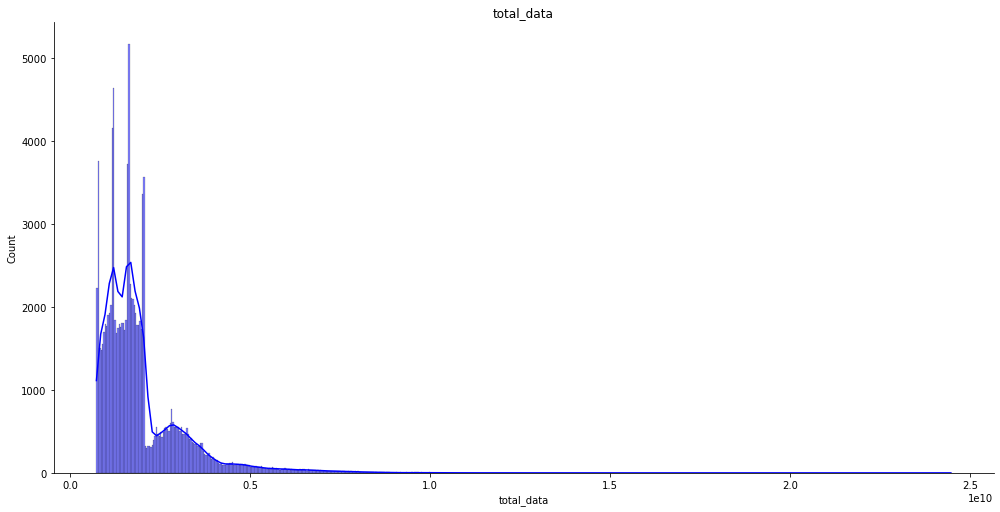

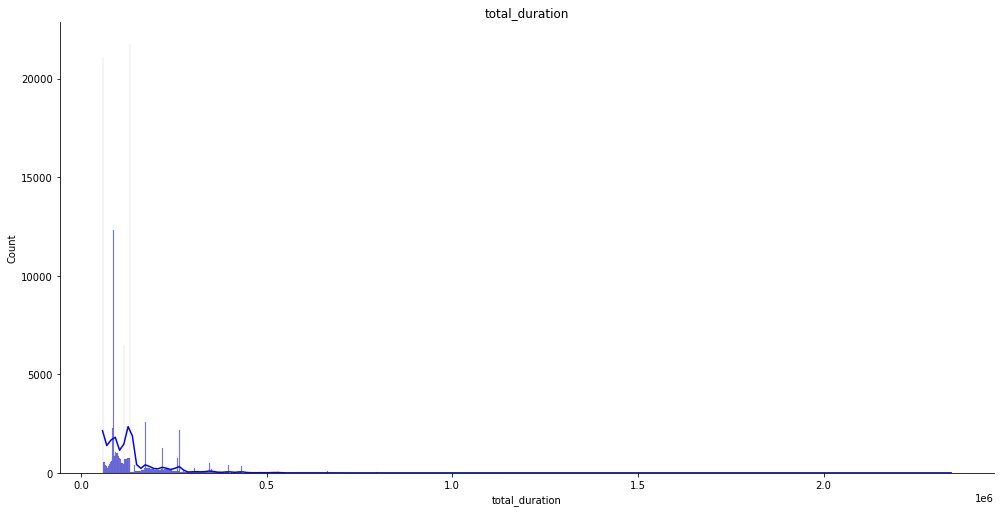

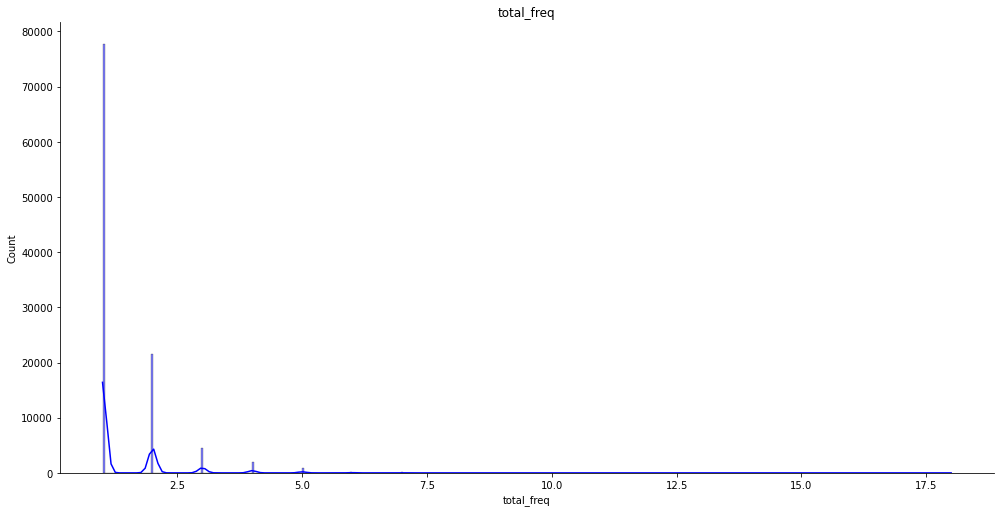

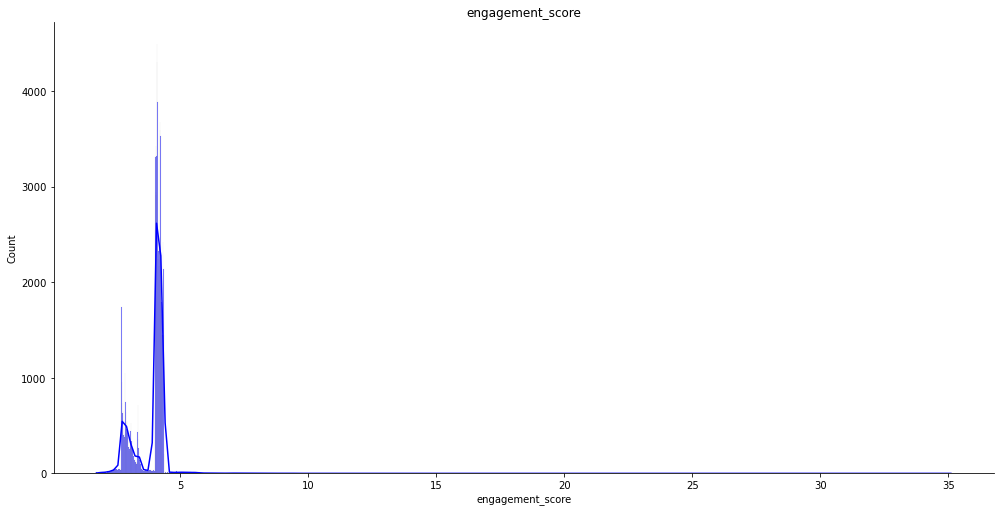

In [175]:
from turtle import color


pltu = PlotingUtils(new_df)
pltu.plot_many_hist(new_df,new_df.columns,color='blue')

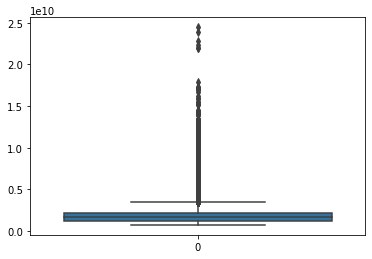

In [176]:
ax = sns.boxplot(data=new_df['total_data'])


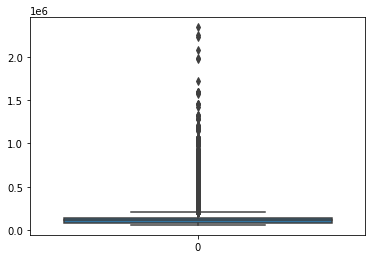

In [177]:
ax = sns.boxplot(data=new_df['total_duration'])


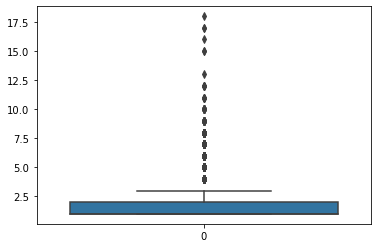

In [178]:
ax = sns.boxplot(data=new_df['total_freq'])


### D. Aggregate user total traffic per application

1. aggregate

In [179]:
selected_columns = datainfo.get_column_with_string(df,'Bytes')
app_df = df[['MSISDN/Number']+selected_columns]
app_df 

,MSISDN/Number,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,3.366496e+10,1545765.0,24420.0,2882527.0,1271433.0,2689643.0,233424.0,15854611.0,5516630.0,8198936.0,9656251.0,278082303.0,12431866.0,210210522.0,8814393.0,36749741.0,308879636.0
1,3.368185e+10,1926113.0,16438.0,3493924.0,1023940.0,892636.0,308339.0,17445747.0,16514443.0,17470857.0,16504387.0,608750074.0,4130119.0,526904238.0,12382051.0,49032572.0,653384965.0
2,3.376063e+10,1684053.0,42224.0,8535055.0,1694064.0,2689643.0,672973.0,17445747.0,14699576.0,17470857.0,6163408.0,229584621.0,4130119.0,410692588.0,4215763.0,33217523.0,279807335.0
3,3.375034e+10,898953.0,16438.0,8624474.0,2788027.0,1439754.0,631229.0,17445747.0,15146643.0,13994646.0,5474441.0,633171122.0,10849722.0,631660688.0,12382051.0,43324218.0,665661693.0
4,3.369980e+10,898953.0,49327.0,6248284.0,1500559.0,1936496.0,233424.0,15259380.0,16514443.0,17124581.0,5474441.0,527707248.0,4130119.0,550709500.0,12382051.0,38542814.0,569138589.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148930,3.366865e+10,962097.0,31078.0,2882527.0,1023940.0,2689643.0,700446.0,6550499.0,16514443.0,17470857.0,7149728.0,633171122.0,12431866.0,321383162.0,12382051.0,49032572.0,665661693.0
148931,3.365069e+10,2694894.0,49327.0,8624474.0,2817311.0,892636.0,633237.0,16191667.0,11763428.0,17470857.0,16504387.0,526609673.0,9197207.0,210210522.0,12382051.0,49032572.0,574175259.0
148932,3.366345e+10,2344568.0,16438.0,2882527.0,2185941.0,1954414.0,233424.0,13877234.0,8288284.0,17470857.0,16504387.0,626893062.0,4735033.0,631660688.0,4145042.0,39135081.0,665661693.0
148933,3.362189e+10,1245845.0,16438.0,3850890.0,2734579.0,1525734.0,532543.0,17445747.0,5516630.0,9963942.0,5474441.0,553539484.0,12431866.0,210210522.0,11314729.0,34912224.0,592786405.0


In [180]:
paired_columns = []

for i in range(len(selected_columns)//2):
    paired_columns.append( [selected_columns[2*i],selected_columns[2*i+1]])
paired_columns

[['Social Media DL (Bytes)', 'Social Media UL (Bytes)'],
 ['Google DL (Bytes)', 'Google UL (Bytes)'],
 ['Email DL (Bytes)', 'Email UL (Bytes)'],
 ['Youtube DL (Bytes)', 'Youtube UL (Bytes)'],
 ['Netflix DL (Bytes)', 'Netflix UL (Bytes)'],
 ['Gaming DL (Bytes)', 'Gaming UL (Bytes)'],
 ['Other DL (Bytes)', 'Other UL (Bytes)'],
 ['Total UL (Bytes)', 'Total DL (Bytes)']]

In [181]:
agg_app_df = app_df.groupby('MSISDN/Number').agg({c:'sum' for c in selected_columns})
agg_app_df = agg_app_df.reset_index()
agg_app_df 

,MSISDN/Number,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,3.360100e+10,2206504.0,25631.0,3337123.0,1051882.0,892636.0,493962.0,14900201.0,6724347.0,10265105.0,16504387.0,6.331711e+08,4130119.0,377096990.0,9473882.0,36053108.0,6.656617e+08
1,3.360100e+10,2598548.0,49327.0,4197697.0,1137166.0,2689643.0,478960.0,5831214.0,7107972.0,5779874.0,10451194.0,2.104576e+08,12431866.0,279557701.0,4145042.0,36104459.0,2.430940e+08
2,3.360100e+10,2694894.0,47619.0,3343483.0,1023940.0,2436500.0,700446.0,5831214.0,16514443.0,16525919.0,5474441.0,5.290685e+08,9759228.0,495086501.0,6607171.0,39306820.0,5.566597e+08
3,3.360101e+10,898953.0,28825.0,5937765.0,3088360.0,2178618.0,233424.0,5831214.0,5516630.0,5779874.0,5474441.0,3.880748e+08,4130119.0,210210522.0,10031701.0,33217523.0,4.019932e+08
4,3.360101e+10,2861230.0,51312.0,13728668.0,4770948.0,2247808.0,933870.0,13858847.0,29527330.0,23250731.0,22555846.0,1.142414e+09,8260238.0,841871210.0,24764102.0,87513999.0,1.212759e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106851,3.379000e+10,898953.0,49327.0,6834178.0,1023940.0,892636.0,525969.0,8294310.0,16514443.0,14754741.0,5474441.0,6.331711e+08,4130119.0,291391283.0,4145042.0,33217523.0,6.656617e+08
106852,3.379000e+10,898953.0,49327.0,2882527.0,3088360.0,2513433.0,233424.0,5831214.0,14254710.0,6929961.0,5474441.0,4.276202e+08,9383076.0,210210522.0,6479040.0,35732243.0,4.445751e+08
106853,3.197021e+12,898953.0,46628.0,8572779.0,1865881.0,892636.0,678492.0,9839889.0,5516630.0,10340908.0,16251392.0,2.104576e+08,12431866.0,467678100.0,4145042.0,37295915.0,2.430940e+08
106854,3.370000e+14,898953.0,25229.0,8215537.0,1615080.0,2689643.0,328919.0,16690728.0,16514443.0,9983678.0,16504387.0,5.012590e+08,8883653.0,210210522.0,4834382.0,49032572.0,5.396350e+08


In [182]:
total_df = pd.DataFrame()
total_df['MSISDN/Number'] = agg_app_df['MSISDN/Number']
for col in paired_columns:
    total_df[col[0].split(' ')[0]] = agg_app_df[col[0]] + agg_app_df[col[1]]
total_df

,MSISDN/Number,Social,Google,Email,Youtube,Netflix,Gaming,Other,Total
0,3.360100e+10,2232135.0,4389005.0,1386598.0,21624548.0,26769492.0,6.373012e+08,386570872.0,7.017148e+08
1,3.360100e+10,2647875.0,5334863.0,3168603.0,12939186.0,16231068.0,2.228895e+08,283702743.0,2.791984e+08
2,3.360100e+10,2742513.0,4367423.0,3136946.0,22345657.0,22000360.0,5.388277e+08,501693672.0,5.959665e+08
3,3.360101e+10,927778.0,9026125.0,2412042.0,11347844.0,11254315.0,3.922050e+08,220242223.0,4.352107e+08
4,3.360101e+10,2912542.0,18499616.0,3181678.0,43386177.0,45806577.0,1.150675e+09,866635312.0,1.300273e+09
...,...,...,...,...,...,...,...,...,...
106851,3.379000e+10,948280.0,7858118.0,1418605.0,24808753.0,20229182.0,6.373012e+08,295536325.0,6.988792e+08
106852,3.379000e+10,948280.0,5970887.0,2746857.0,20085924.0,12404402.0,4.370033e+08,216689562.0,4.803073e+08
106853,3.197021e+12,945581.0,10438660.0,1571128.0,15356519.0,26592300.0,2.228895e+08,471823142.0,2.803899e+08
106854,3.370000e+14,924182.0,9830617.0,3018562.0,33205171.0,26488065.0,5.101427e+08,215044904.0,5.886676e+08


2. top 10 most engaged user per applications

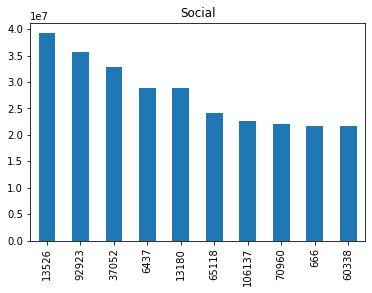

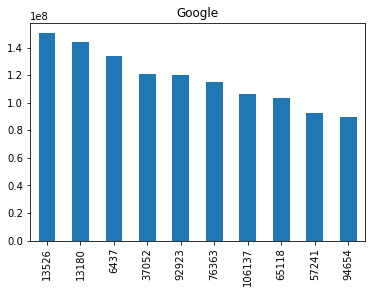

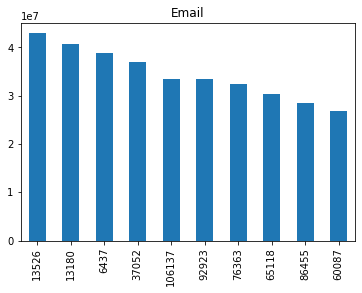

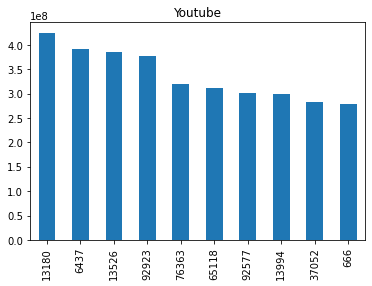

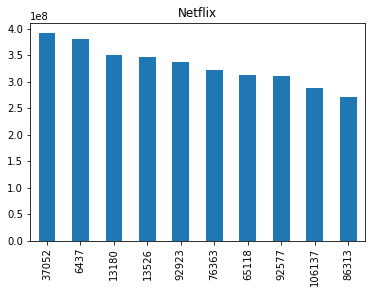

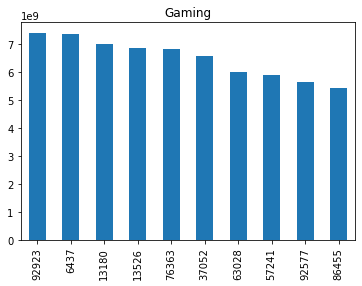

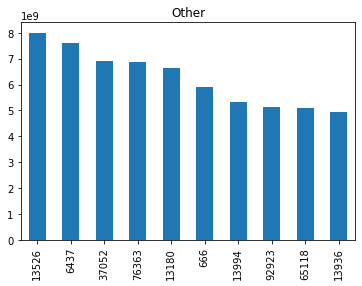

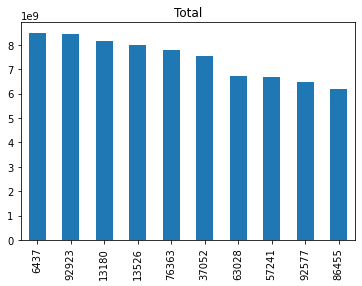

In [183]:
for col in total_df.columns[1:]:
    total_df.sort_values(col,ascending=False)[col][:10].plot(kind='bar',title=col)
    plt.show()

### E. Top 3 most used application

In [184]:
sum_df = total_df.loc[:, total_df.columns != 'MSISDN/Number']
sum_df = sum_df.loc[:, sum_df.columns != 'Total']
sum_df = pd.DataFrame(sum_df.sum(),columns=['sum']).sort_values('sum',ascending=False)
sum_df

,sum
Gaming,6.409620e+13
Other,6.392823e+13
Youtube,3.372986e+12
Netflix,3.369775e+12
Google,1.163575e+12
Email,3.364394e+11
Social,2.724087e+11


<AxesSubplot:>

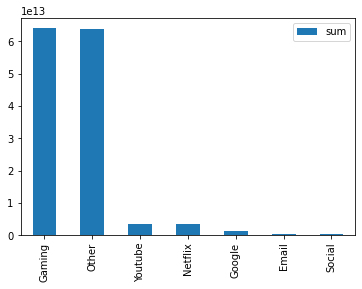

In [185]:
sum_df.plot.bar()


### F. K-mean clustering - optimized k values 

In [186]:
seg_eng_df = total_df.loc[:, total_df.columns != 'Total']
seg_eng_df = seg_eng_df.loc[:, seg_eng_df.columns != 'MSISDN/Number']
seg_eng_df


,Social,Google,Email,Youtube,Netflix,Gaming,Other
0,2232135.0,4389005.0,1386598.0,21624548.0,26769492.0,6.373012e+08,386570872.0
1,2647875.0,5334863.0,3168603.0,12939186.0,16231068.0,2.228895e+08,283702743.0
2,2742513.0,4367423.0,3136946.0,22345657.0,22000360.0,5.388277e+08,501693672.0
3,927778.0,9026125.0,2412042.0,11347844.0,11254315.0,3.922050e+08,220242223.0
4,2912542.0,18499616.0,3181678.0,43386177.0,45806577.0,1.150675e+09,866635312.0
...,...,...,...,...,...,...,...
106851,948280.0,7858118.0,1418605.0,24808753.0,20229182.0,6.373012e+08,295536325.0
106852,948280.0,5970887.0,2746857.0,20085924.0,12404402.0,4.370033e+08,216689562.0
106853,945581.0,10438660.0,1571128.0,15356519.0,26592300.0,2.228895e+08,471823142.0
106854,924182.0,9830617.0,3018562.0,33205171.0,26488065.0,5.101427e+08,215044904.0


In [187]:
normalized_seg_eng_df = (seg_eng_df-seg_eng_df.mean())/seg_eng_df.std()
normalized_seg_eng_df


,Social,Google,Email,Youtube,Netflix,Gaming,Other
0,-0.185878,-0.933742,-0.867005,-0.501197,-0.240323,0.093409,-0.528153
1,0.057766,-0.797871,0.009877,-0.939081,-0.771697,-0.939842,-0.784797
2,0.113229,-0.936842,-0.005700,-0.464842,-0.480795,-0.152115,-0.240935
3,-0.950296,-0.267626,-0.362408,-1.019311,-1.022638,-0.517689,-0.943124
4,0.212874,1.093228,0.016311,0.595944,0.719576,1.373401,0.669552
...,...,...,...,...,...,...,...
106851,-0.938280,-0.435409,-0.851255,-0.340661,-0.570102,0.093409,-0.755274
106852,-0.938280,-0.706507,-0.197654,-0.578769,-0.964648,-0.405993,-0.951987
106853,-0.939862,-0.064717,-0.776202,-0.817208,-0.249257,-0.939842,-0.315458
106854,-0.952403,-0.152062,-0.063954,0.082655,-0.254513,-0.223635,-0.956091


In [188]:
from sklearn.cluster import KMeans
Kmean = KMeans(n_clusters=3)
Kmean.fit(normalized_seg_eng_df)

centroids = Kmean.cluster_centers_
centroids


array([[-0.42146098, -0.44086225, -0.43476807, -0.44713215, -0.44813562,
        -0.41889217, -0.42004241],
       [ 3.34955955,  3.51898639,  3.48973341,  3.57246357,  3.54620146,
         3.35562111,  3.35093781],
       [ 0.82635459,  0.86225689,  0.84761699,  0.87403851,  0.88080961,
         0.81760311,  0.82179805]])

### Elbow Method

***Elbow Method***
In the Elbow method, the the number of clusters ( K ) is varied from 1 – n. For each value of K, we  calculate WCSS ( Within-Cluster Sum of Square ), it is also called inertia. WCSS is the sum of squared distance between each point and the centroid in a cluster. When we plot the WCSS with the K value, the plot looks like an Elbow. As the number of clusters increases, the WCSS value will start to decrease. WCSS value is largest when K = 1. When we analyze the graph we can see that the graph will rapidly change at a point and thus creating an elbow shape. From this point, the graph starts to move almost parallel to the X-axis. The K value corresponding to this point is the optimal K value or an optimal number of clusters.

[Elbow Method](https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/)
![Elbow Point](https://editor.analyticsvidhya.com/uploads/43191elbow_img%20(1).png)
1. Distortion: It is calculated as the average of the squared distances from the cluster centers of the respective clusters. Typically, the Euclidean distance metric is used.
2. Inertia: It is the sum of squared distances of samples to their closest cluster center.

We iterate the values of k from 1 to 9 and calculate the values of distortions for each value of k and calculate the distortion and inertia for each value of k in the given range.

To determine the optimal number of clusters, we have to select the value of k at the “elbow” ie the point after which the distortion/inertia start decreasing in a linear fashion. Thus for the given data, we conclude that the optimal number of clusters for the data is 3.

In [189]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)

for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(normalized_seg_eng_df)
    kmeanModel.fit(normalized_seg_eng_df)

    distortions.append(sum(np.min(cdist(normalized_seg_eng_df, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / normalized_seg_eng_df.shape[0])
    inertias.append(kmeanModel.inertia_)

    mapping1[k] = sum(np.min(cdist(normalized_seg_eng_df, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / normalized_seg_eng_df.shape[0]
    mapping2[k] = kmeanModel.inertia_


In [190]:

for key, val in mapping1.items():
    print(f'{key} : {val}')


1 : 2.0426409259646765
2 : 1.421846937055123
3 : 1.2454930437155165
4 : 1.185949048810968
5 : 1.1689663635529117
6 : 1.1084192567364264
7 : 1.0725031856484881
8 : 1.0649121916942788
9 : 1.0441286520500594


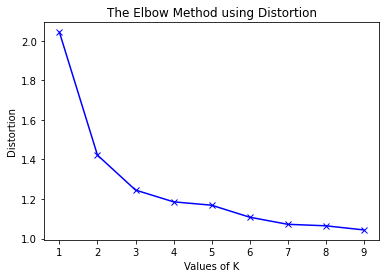

In [191]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()


In [192]:
for key, val in mapping2.items():
    print(f'{key} : {val}')


1 : 747985.0000000012
2 : 366893.8283864304
3 : 220822.68821180525
4 : 184523.45650524166
5 : 169139.04625834659
6 : 156903.07986556995
7 : 150079.82054755796
8 : 142618.222923672
9 : 136653.81956160534


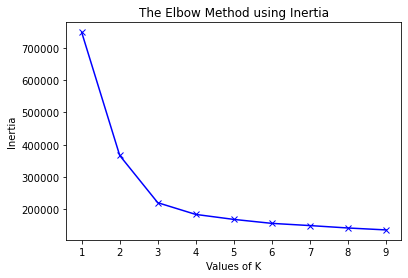

In [193]:
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()


To determine the optimal number of clusters, we have to select the value of k at the “elbow” ie the point after which the distortion/inertia start decreasing in a linear fashion. Thus for the given data, we conclude that the optimal number of clusters for the data is 3.